# Testing the calibration process

In [1]:
import io
import sys
import os
import math   as m
import numpy  as np
import tables as tb
import pandas as pd
import warnings
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm


import h5py

from typing import BinaryIO
from typing import Generic
from typing import Optional


sys.path.append("/home/e78368jw/Documents/MULE/")
# imports start from MULE/
from packs.core.core_utils import flatten
from packs.core.core_utils import MalformedHeaderError
from packs.core.io import writer, reader
from packs.types import types

In [ ]:
calibration_info_type = np.dtype([
            ('event_number', np.uint32),
            ('channels',     np.uint32),
            ('integrated_Q',  np.float64),
            ('height',       np.float64),
            ])

In [23]:
# relevant functions
def subtract_baseline(y_data, sub_type = 'median'):
    '''
    determines the value that should be subtracted to produce baseline
    '''

    # MEAN METHOD
    # add all ADC values and divide by length (rough), also remove negatives
    match sub_type:
        case 'mean':
            total = (np.sum(y_data)/len(y_data))

        case 'median':
            total = np.median(y_data)

        case _:
            print("Please input a baseline method, exiting...")
            total = 0

    return total


def find_nearest(array, value):
    '''
    Finds the array value closest to the provided value
    '''
    idx = np.searchsorted(array, value, side="left")
    if idx > 0 and (idx == len(array) or m.fabs(value - array[idx-1]) < m.fabs(value - array[idx])):
        return array[idx-1]
    else:
        return array[idx]


def collect_index(time, value):
    '''
    Collects the array index corresponding to a certain time value

    Args:
        time        (np.array)        :     Time array
        value       (float/int)       :     Value that you wish to locate the index of
    '''
    
    val = find_nearest(time, value)
    index = np.where(time == val)[0]

    if len(index == 1):
        return index[0]
    else:
        raise Exception("Index collection found more than one value with the same value entered.\nAre you sure you entered the right array?")


def integrate(y_data):
    '''
    Collect the integral across an event by summing y components
    '''
    return np.sum(y_data)
    

def extract_peak(y_data) :
    '''
    Collects peak and index of peak in data.
    '''
    return (np.max(y_data), np.argmax(y_data))


def visualise_waveforms(file, cali_params):
    '''
    Visualise waveforms and ask the user if the sidebands
    and integration window are acceptable.
    '''
    for i, waveform in enumerate(reader(file, 'rwf', 'rwf_-1', 'r+')):
        plt.plot(time, waveform['rwf'], alpha = 0.2, zorder = 1)
        if i > 100: # ensures minimal plotting
            break
    if cali_params['baseline_sub'] is not None:
        for i, band in enumerate(cali_params['sidebands']):
            plt.axvspan(band[0], band[1], alpha = 0.2, label = f'Baseline band {i}', zorder = 2)
    if cali_params['method'] == 'manual':
        plt.axvspan(cali_params['window'][0], cali_params['window'][1], color = 'red', alpha = 0.2, label = f'Integration window', zorder = 2)

    plt.legend()
    plt.xlabel('Time (ns)')
    plt.ylabel('Waveform signal (ADC)') 
    plt.show()
    # ask if the user is happy with these bands?
    response = input("Are the bands acceptable? [y/n]: ").strip().lower()
    if response not in ['y', 'yes']:
        print("Please reset the bands and process again")
        exit()

def collect_sidebands(wf, time, cali_params):
    '''
    extract the sideband components of the waveform
    '''
    sideband_values = []
    for i, band in enumerate(cali_params['sidebands']):
        # extract the baseline indexes from time and collect y values
        bl_range = [collect_index(time, band[0]), collect_index(time, band[1])]
        sideband_values.append(wf[bl_range[0]:bl_range[1]])

    return sideband_values

def collect_integration_window(time, cali_params, H_index):
    '''
    extract the integration window index of the waveform
    '''
    match cali_params['method']:
        case 'manual':
            start_index = collect_index(time, cali_params['window'][0])
            end_index   = collect_index(time, cali_params['window'][1])
        case 'height':
            start_index = collect_index(time, time[H_index] - cali_params['window'][0])
            end_index = collect_index(time, time[H_index] + cali_params['window'][1])
        case _:
            raise ValueError(f'{cali_params['method']} is not a valid integration method.')
    
    return (start_index, end_index)
        

In [4]:
file = 'three_channels_WD2.h5'

In [39]:
# extract relevant information from event info (assuming static)
scout                                    = reader(file, 'event_information', 'ei_-1')
_, _, samples, sampling_period, channels = next(scout)
del scout

print(f'file: {file}\nsamples: {samples}\nsampling_period: {sampling_period}\nchannels: {channels}')

time = np.linspace(0,samples * sampling_period, num = samples) 

wf_dtype = types.rwf_type(samples)

file: three_channels_WD2.h5
samples: 1000
sampling_period: 8
channels: 3


In [106]:
negative     = True
visualise    = True

cali_params = dict(
    method = 'manual',
    window = (5000,6000),
    baseline_sub = 'median',
    sidebands = ((100, 300), (2900, 3100)),
    negative = True
)

#cali_params = {'method'        :  'manual',
#               'window'        :  (5000, 6000),
#               'baseline_sub'  :  'median',
#               'sidebands'     :  ((100, 300), (2900, 3100)),
#               'negative'      :  True}

KeyError: 'baseline_sub'

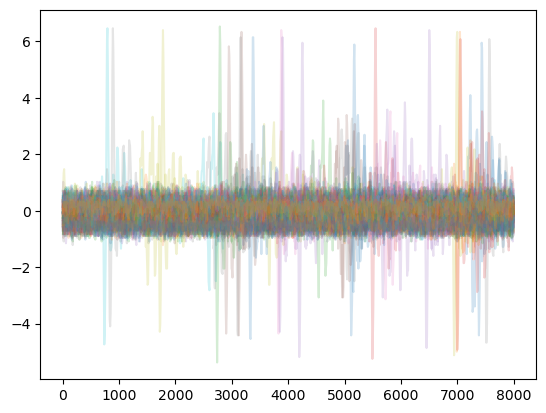

In [45]:
# visualise to ensure the sidebands are okay
# sampling period defines time between 

# visualise the first 100 waveforms to ensure the sidebands are correct
if visualise:
    visualise_waveforms(file, cali_params)

In [ ]:

# processing overarching function


with writer(file, 'CALI', overwrite = True) as scribe:
    for waveform in reader(file, 'rwf', 'rwf_-1', 'r+'):
        
        evt_num  = waveform['event_number']
        channels = waveform['channels']
        wf       = waveform['rwf']

        # flip the waveform
        if cali_params['negative']:
            wf = -wf

        # baseline subtraction
        if cali_params['baseline_sub'] is not None:
            sideband_values = collect_sidebands(wf, time, cali_params)
            wf = wf - subtract_baseline(sideband_values, sub_type = cali_params['baseline_sub'])

        # extract height and its index
        H_val, H_index = extract_peak(wf)

        start_index, end_index = collect_integration_window(time, cali_params, H_index)
        Q_val = integrate(wf[start_index:end_index])
        
        # write with correct format
        x = [(evt_num, channels, Q_val, H_val)]
        info = np.array(x, dtype = calibration_info_type)
        swf  = np.array((evt_num, channels, wf), dtype = wf_dtype)
        print(wf)
        print(swf)
        scribe('waveform_information', info)
        scribe('subwf-1', swf)
        
        





[ 0.128       0.512      -0.064       0.512       0.384       0.64000005
  0.192       0.448       0.064       0.256       0.         -0.384
  0.          0.192       0.          0.128      -0.064       0.32
  0.128       0.448      -0.128       0.448      -0.128       0.192
  0.128      -0.064       0.256       0.256      -0.064       0.256
 -0.384      -0.19199999 -0.128       0.128      -0.19199999  0.256
 -0.064       0.256      -0.064       0.256       0.192       0.192
  0.128       0.57600003  0.32        0.256      -0.128       0.448
  0.128       0.704       0.384       0.384      -0.19199999  0.256
  0.128       0.064      -0.25599998  0.32        0.192       0.064
 -0.384      -0.064      -0.128      -0.19199999 -0.19199999  0.192
 -0.19199999  0.256       0.192       0.64000005  0.32        0.384
  0.128       0.448       0.384       0.512       0.256       0.192
  0.128       0.128       0.          0.256      -0.128       0.192
  0.192       0.32       -0.384       0.192 

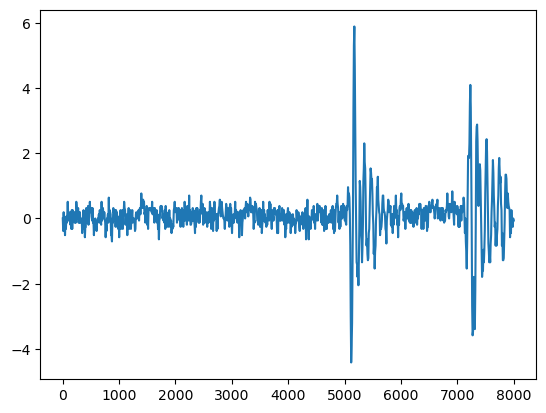

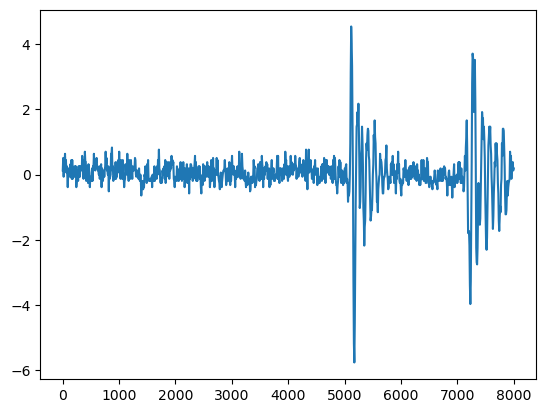

In [46]:
# test by comparing one waveform to its sub section
for i, waveform in enumerate(reader(file, 'rwf', 'rwf_-1', 'r+')):
    plt.plot(time, waveform[-1])
    plt.show()
    break
for i, waveform in enumerate(reader(file, 'CALI', 'subwf-1', 'r+')):
    plt.plot(time, waveform[-1])
    plt.show()
    break

In [70]:
with h5py.File(chunked_file, 'r') as f:
    gr = f['event_information']
    print(gr)
    dset = gr.keys()
    print(dset)
    print(gr['ei_0'])

    #def print_name(name):
    #    print(name)

    #f.visit(print_name)

<HDF5 group "/event_information" (2990 members)>
<KeysViewHDF5 ['ei_0', 'ei_1000', 'ei_10000', 'ei_100000', 'ei_1000000', 'ei_1001000', 'ei_1002000', 'ei_1003000', 'ei_1004000', 'ei_1005000', 'ei_1006000', 'ei_1007000', 'ei_1008000', 'ei_1009000', 'ei_101000', 'ei_1010000', 'ei_1011000', 'ei_1012000', 'ei_1013000', 'ei_1014000', 'ei_1015000', 'ei_1016000', 'ei_1017000', 'ei_1018000', 'ei_1019000', 'ei_102000', 'ei_1020000', 'ei_1021000', 'ei_1022000', 'ei_1023000', 'ei_1024000', 'ei_1025000', 'ei_1026000', 'ei_1027000', 'ei_1028000', 'ei_1029000', 'ei_103000', 'ei_1030000', 'ei_1031000', 'ei_1032000', 'ei_1033000', 'ei_1034000', 'ei_1035000', 'ei_1036000', 'ei_1037000', 'ei_1038000', 'ei_1039000', 'ei_104000', 'ei_1040000', 'ei_1041000', 'ei_1042000', 'ei_1043000', 'ei_1044000', 'ei_1045000', 'ei_1046000', 'ei_1047000', 'ei_1048000', 'ei_1049000', 'ei_105000', 'ei_1050000', 'ei_1051000', 'ei_1052000', 'ei_1053000', 'ei_1054000', 'ei_1055000', 'ei_1056000', 'ei_1057000', 'ei_1058000', '

<HDF5 dataset "ei_0": shape (1000,), type "|V28">


In [ ]:
# can you detect chunking and correct for it?
chunked_file = '/media/e78368jw/T7 Shield/TPB/ALPHAS/run.h5'

# before reading in the full waveforms, check the shape


for waveform in reader(chunked_file, 'event_information', 'ei_0', 'r'):
    print(waveform)


(0, 83447, 1500, 2, 1)
(1, 159921, 1500, 2, 1)
(2, 161111, 1500, 2, 1)
(3, 162099, 1500, 2, 1)
(4, 163273, 1500, 2, 1)
(5, 166351, 1500, 2, 1)
(6, 168077, 1500, 2, 1)
(7, 173563, 1500, 2, 1)
(8, 325127, 1500, 2, 1)
(9, 325853, 1500, 2, 1)
(10, 326241, 1500, 2, 1)
(11, 326919, 1500, 2, 1)
(12, 327385, 1500, 2, 1)
(13, 328201, 1500, 2, 1)
(14, 972165, 1500, 2, 1)
(15, 972751, 1500, 2, 1)
(16, 973721, 1500, 2, 1)
(17, 974261, 1500, 2, 1)
(18, 975713, 1500, 2, 1)
(19, 977297, 1500, 2, 1)
(20, 977973, 1500, 2, 1)
(21, 982027, 1500, 2, 1)
(22, 989117, 1500, 2, 1)
(23, 1075129, 1500, 2, 1)
(24, 1078425, 1500, 2, 1)
(25, 1092891, 1500, 2, 1)
(26, 1466463, 1500, 2, 1)
(27, 1728737, 1500, 2, 1)
(28, 1806177, 1500, 2, 1)
(29, 2229507, 1500, 2, 1)
(30, 2229961, 1500, 2, 1)
(31, 2236173, 1500, 2, 1)
(32, 2239229, 1500, 2, 1)
(33, 2241567, 1500, 2, 1)
(34, 2246027, 1500, 2, 1)
(35, 2284005, 1500, 2, 1)
(36, 2407979, 1500, 2, 1)
(37, 2717531, 1500, 2, 1)
(38, 2757701, 1500, 2, 1)
(39, 2835231, 1500, 

In [79]:
# check the chunking
with h5py.File(chunked_file, 'r') as h5f:
    gr = h5f['event_information']
    print(len(gr.keys()))

with h5py.File(file, 'r') as h5f:
    gr = h5f['event_information']
    print(len(gr.keys()))

2990
1


In [99]:
def check_chunking(file):
    '''
    quantifies the chunking within the dataset for processing purposes
    CHUNKING IS OBSOLETE AT THIS POINT DUE TO THE LAZY PROCESSING, 
    THIS IS A BACKWARDS COMPATIBILITY MEASURE.
    '''

    with h5py.File(file, 'r') as h5f:
        gr   = h5f['rwf']
        keys = list(gr.keys())
        l    = len(keys)

    if l > 1:
        return (True, keys, l)
    else:
        return (False, keys, l)
    
        

In [100]:
with h5py.File(file, 'r') as f:
    gr   = f['rwf']
    keys = gr.keys()
    l = len(keys)
    print(gr, keys, l)


<HDF5 group "/rwf" (1 members)> <KeysViewHDF5 ['rwf_-1']> 1


In [107]:
chunked, keys, l_keys = check_chunking(file)


# extract relevant information from event info if chunked or not chunked
if chunked:
    scout                                = reader(file, 'event_information', 'ei_0')
else:
    scout                                    = reader(file, 'event_information', 'ei_-1')
_, _, samples, sampling_period, channels = next(scout)
del scout

print(f'file: {file}\nsamples: {samples}\nsampling_period: {sampling_period}\nchannels: {channels}')

time = np.linspace(0,samples * sampling_period, num = samples) 

wf_dtype = types.rwf_type(samples)




# processing overarching function


with writer(file, 'CALI', overwrite = True) as scribe:
    for key in keys:
        for waveform in reader(file, 'rwf', key, 'r+'):
        
            evt_num  = waveform['event_number']
            channels = waveform['channels']
            wf       = waveform['rwf']

            # flip the waveform
            if cali_params['negative']:
                wf = -wf

            # baseline subtraction
            if cali_params['baseline_sub'] is not None:
                sideband_values = collect_sidebands(wf, time, cali_params)
                wf = wf - subtract_baseline(sideband_values, sub_type = cali_params['baseline_sub'])

            # extract height and its index
            H_val, H_index = extract_peak(wf)

            start_index, end_index = collect_integration_window(time, cali_params, H_index)
            Q_val = integrate(wf[start_index:end_index])
        
            # write with correct format
            x = [(evt_num, channels, Q_val, H_val)]
            info = np.array(x, dtype = calibration_info_type)
            swf  = np.array((evt_num, channels, wf), dtype = wf_dtype)
            print(wf)
            print(swf)
            scribe('waveform_information', info)
            scribe('subwf-1', swf)
        
        



file: three_channels_WD2.h5
samples: 1000
sampling_period: 8
channels: 3
[ 0.128       0.512      -0.064       0.512       0.384       0.64000005
  0.192       0.448       0.064       0.256       0.         -0.384
  0.          0.192       0.          0.128      -0.064       0.32
  0.128       0.448      -0.128       0.448      -0.128       0.192
  0.128      -0.064       0.256       0.256      -0.064       0.256
 -0.384      -0.19199999 -0.128       0.128      -0.19199999  0.256
 -0.064       0.256      -0.064       0.256       0.192       0.192
  0.128       0.57600003  0.32        0.256      -0.128       0.448
  0.128       0.704       0.384       0.384      -0.19199999  0.256
  0.128       0.064      -0.25599998  0.32        0.192       0.064
 -0.384      -0.064      -0.128      -0.19199999 -0.19199999  0.192
 -0.19199999  0.256       0.192       0.64000005  0.32        0.384
  0.128       0.448       0.384       0.512       0.256       0.192
  0.128       0.128       0.          0